In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as patches

In [3]:
Border_Crossing_Data = pd.read_csv("/content/Border_Crossing_Entry_Data.csv")

In [4]:
Border_Crossing_Data.head()

,Port Name,State,Port Code,Border,Date,Measure,Value,Latitude,Longitude,Point
0,International Falls,Minnesota,3604,US-Canada Border,Oct 2023,Trucks,1372,48.608,-93.401,POINT (-93.401355 48.6078)
1,Sumas,Washington,3009,US-Canada Border,Oct 2023,Train Passengers,57,49.002,-122.265,POINT (-122.264805 49.002388)
2,Naco,Arizona,2603,US-Mexico Border,Sep 2023,Trucks,270,31.334,-109.948,POINT (-109.948413 31.334084)
3,Wildhorse,Montana,3323,US-Canada Border,Sep 2023,Trucks,42,48.999,-110.215,POINT (-110.215083 48.999361)
4,Calais,Maine,115,US-Canada Border,Sep 2023,Trains,15,45.189,-67.275,POINT (-67.275381 45.188548)


In [5]:
Border_Crossing_Data.columns

Index(['Port Name', 'State', 'Port Code', 'Border', 'Date', 'Measure', 'Value',
       'Latitude', 'Longitude', 'Point'],
      dtype='object')

In [8]:
Border_Crossing_Data.isnull().sum()

Port Name    0
State        0
Port Code    0
Border       0
Date         0
Measure      0
Value        0
Latitude     1
Longitude    1
Point        1
dtype: int64

In [9]:
Border_Crossing_Data.describe(include='all')

,Port Name,State,Port Code,Border,Date,Measure,Value,Latitude,Longitude,Point
count,388823,388823,388823.000000,388823,388823,388823,3.888230e+05,388822.000000,388822.000000,388822
unique,117,14,NaN,2,336,12,NaN,NaN,NaN,116
top,Eastport,North Dakota,NaN,US-Canada Border,Sep 2010,Personal Vehicles,NaN,NaN,NaN,POINT (-115.388018 32.673389)
freq,6506,62926,NaN,297313,1356,36290,NaN,NaN,NaN,7220
mean,NaN,NaN,2447.647397,NaN,NaN,NaN,2.865384e+04,43.985121,-99.751205,NaN
std,NaN,NaN,1203.720252,NaN,NaN,NaN,1.496965e+05,8.149051,18.255622,NaN
min,NaN,NaN,101.000000,NaN,NaN,NaN,0.000000e+00,25.952000,-141.001000,NaN
25%,NaN,NaN,2304.000000,NaN,NaN,NaN,0.000000e+00,42.999000,-114.728000,NaN
50%,NaN,NaN,3012.000000,NaN,NaN,NaN,1.350000e+02,48.496000,-101.628000,NaN
75%,NaN,NaN,3401.000000,NaN,NaN,NaN,2.894000e+03,49.000000,-89.585000,NaN


In [10]:
import pandas as pd

# Assuming your dataset is stored in a DataFrame called df
# Convert the 'Date' column to datetime format
Border_Crossing_Data['Date'] = pd.to_datetime(Border_Crossing_Data['Date'])

# Extract additional features from the date, such as year, month, day, etc.
Border_Crossing_Data['Year'] = Border_Crossing_Data['Date'].dt.year
Border_Crossing_Data['Month'] = Border_Crossing_Data['Date'].dt.month
Border_Crossing_Data['Day'] = Border_Crossing_Data['Date'].dt.day
# You can extract more features like day of week, week of year, etc. based on your requirements

# Drop the original 'Date' column if it's no longer needed
Border_Crossing_Data.drop(columns=['Date'], inplace=True)

# Now, your dataset should have additional columns for year, month, day, etc., which you can use in your machine learning models


In [11]:
Border_Crossing_Data.head()

,Port Name,State,Port Code,Border,Measure,Value,Latitude,Longitude,Point,Year,Month,Day
0,International Falls,Minnesota,3604,US-Canada Border,Trucks,1372,48.608,-93.401,POINT (-93.401355 48.6078),2023,10,1
1,Sumas,Washington,3009,US-Canada Border,Train Passengers,57,49.002,-122.265,POINT (-122.264805 49.002388),2023,10,1
2,Naco,Arizona,2603,US-Mexico Border,Trucks,270,31.334,-109.948,POINT (-109.948413 31.334084),2023,9,1
3,Wildhorse,Montana,3323,US-Canada Border,Trucks,42,48.999,-110.215,POINT (-110.215083 48.999361),2023,9,1
4,Calais,Maine,115,US-Canada Border,Trains,15,45.189,-67.275,POINT (-67.275381 45.188548),2023,9,1


In [12]:

columns_to_clean =  ['Latitude', 'Longitude', 'Point']  # Specify the columns you want to clean
Border_Crossing_Data = Border_Crossing_Data.dropna(subset=columns_to_clean)

# Check if there are any remaining null values
print("Remaining null values after cleaning:")
print(Border_Crossing_Data.isnull().sum())


Remaining null values after cleaning:
Port Name    0
State        0
Port Code    0
Border       0
Measure      0
Value        0
Latitude     0
Longitude    0
Point        0
Year         0
Month        0
Day          0
dtype: int64


In [13]:
Border_Crossing_Data.duplicated().sum()

10

In [14]:
Border_count = Border_Crossing_Data.Border.value_counts()
Border_count

US-Canada Border    297312
US-Mexico Border     91510
Name: Border, dtype: int64

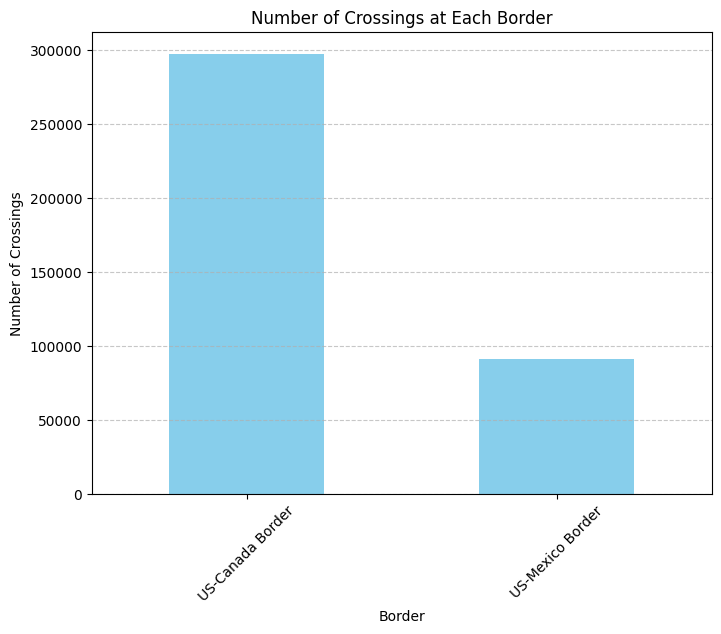

In [15]:
# Count the number of crossings at each border
border_count = Border_Crossing_Data['Border'].value_counts()

# Plot the number of crossings at each border
plt.figure(figsize=(8, 6))
border_count.plot(kind='bar', color='skyblue')
plt.title('Number of Crossings at Each Border')
plt.xlabel('Border')
plt.ylabel('Number of Crossings')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


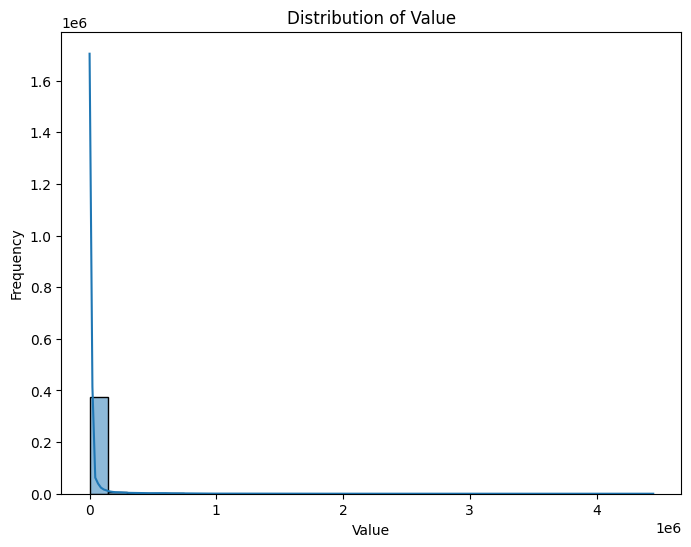

In [16]:
# Distribution of numerical features
numeric_features = ['Value']
for feature in numeric_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(Border_Crossing_Data[feature], bins=30, kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

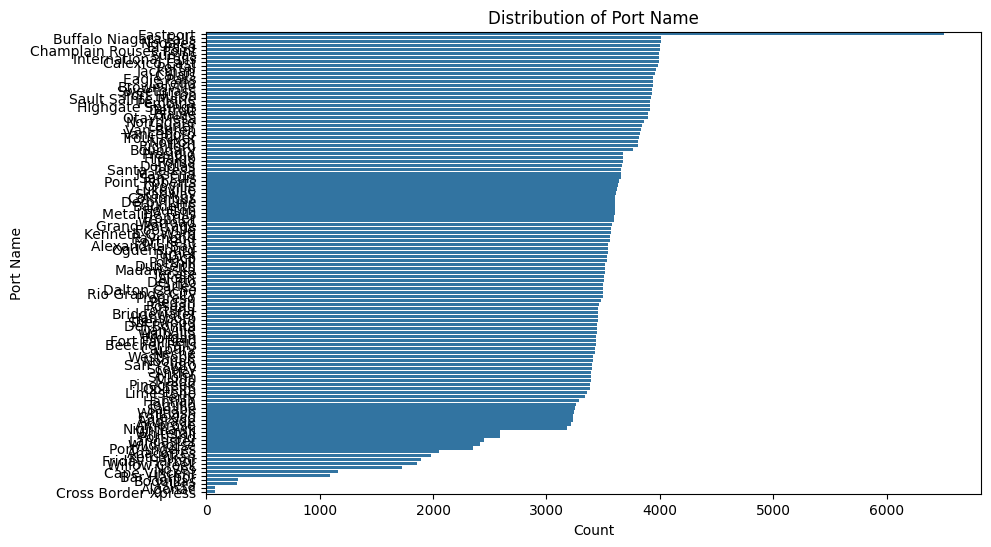

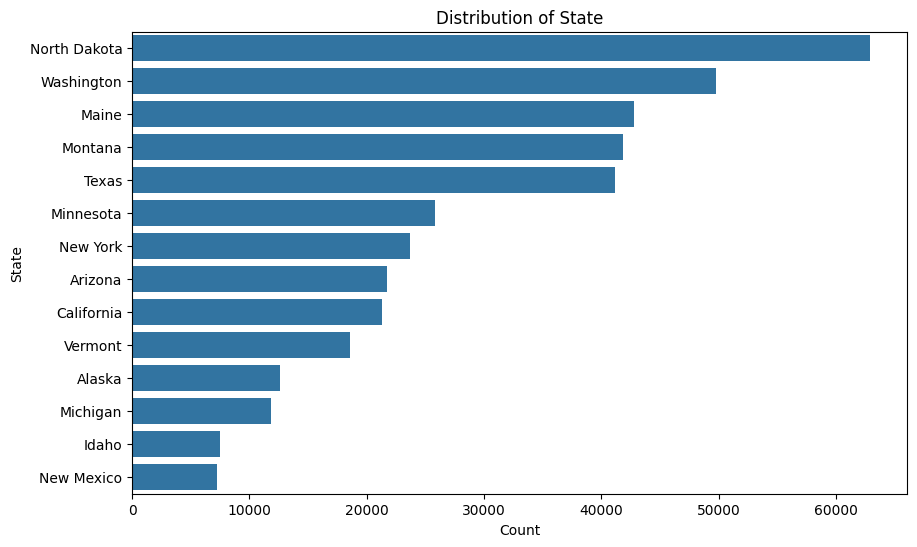

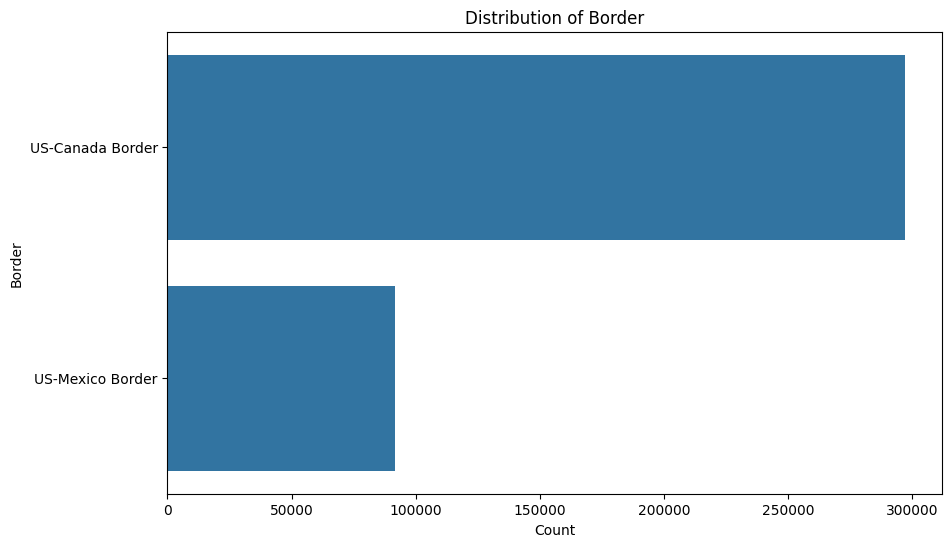

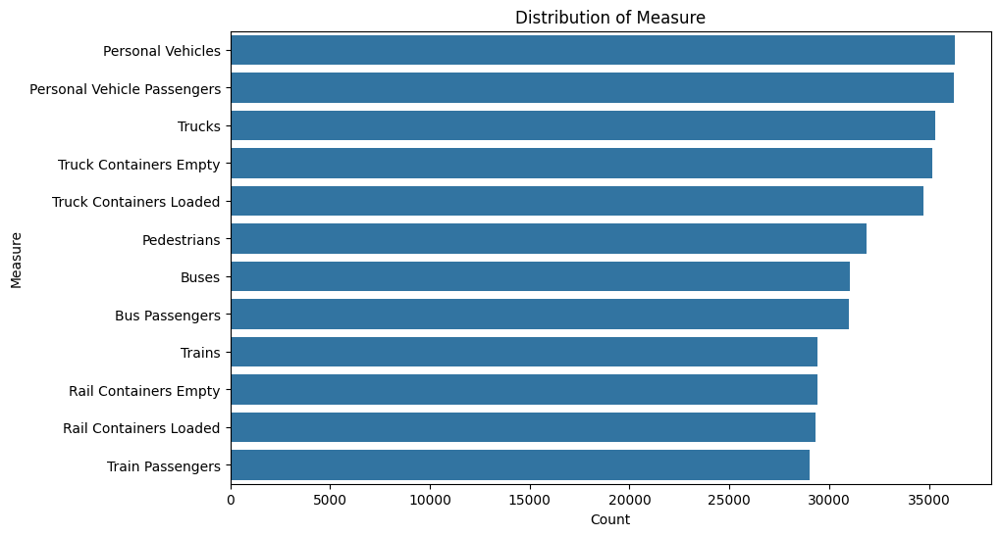

In [17]:
# Distribution of categorical features
categorical_features = ['Port Name', 'State', 'Border', 'Measure']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=Border_Crossing_Data[feature], order=Border_Crossing_Data[feature].value_counts().index)
    plt.title(f'Distribution of {feature}')
    plt.xlabel('Count')
    plt.ylabel(feature)
    plt.show()


<ipython-input-18-65c12ba194e8>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = Border_Crossing_Data.corr()


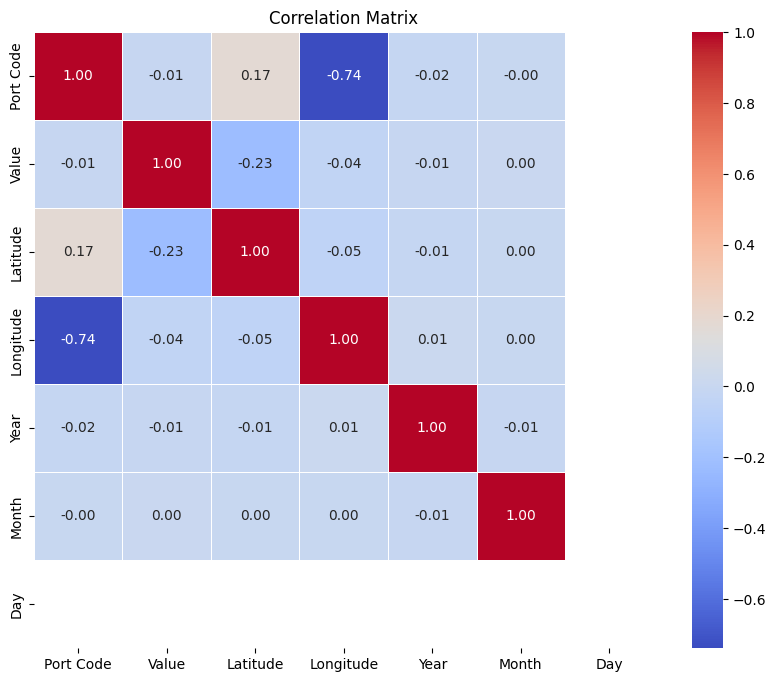

In [18]:
# Correlation analysis
correlation_matrix = Border_Crossing_Data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


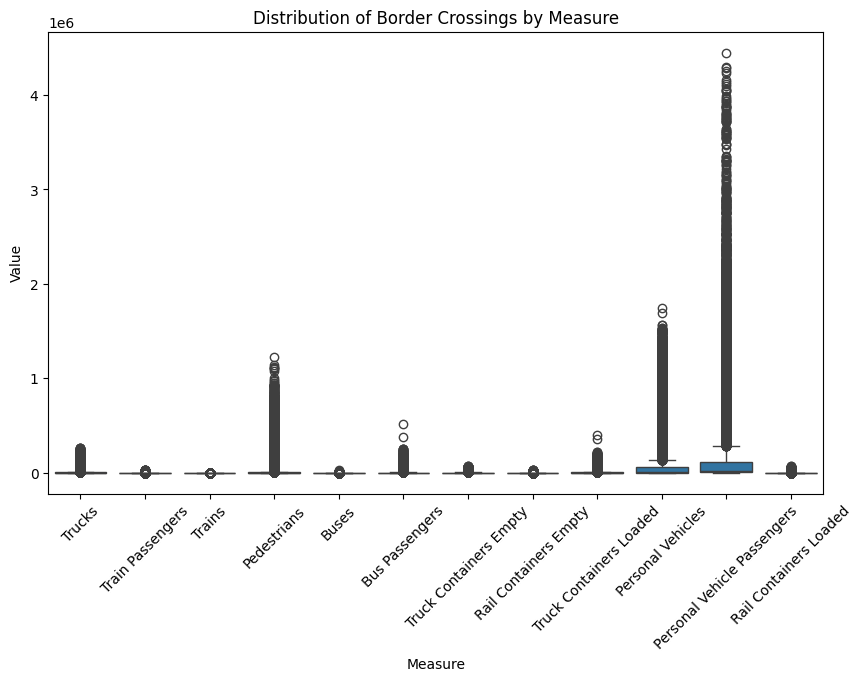

In [19]:
# Measure-wise analysis
plt.figure(figsize=(10, 6))
sns.boxplot(x='Measure', y='Value', data=Border_Crossing_Data)
plt.title('Distribution of Border Crossings by Measure')
plt.xlabel('Measure')
plt.ylabel('Value')
plt.xticks(rotation=45)
plt.show()


<ipython-input-20-92c6a992a2c7>:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Value', y='Port Name', data=Border_Crossing_Data, estimator=sum, ci=None, palette='muted')
<ipython-input-20-92c6a992a2c7>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Value', y='Port Name', data=Border_Crossing_Data, estimator=sum, ci=None, palette='muted')


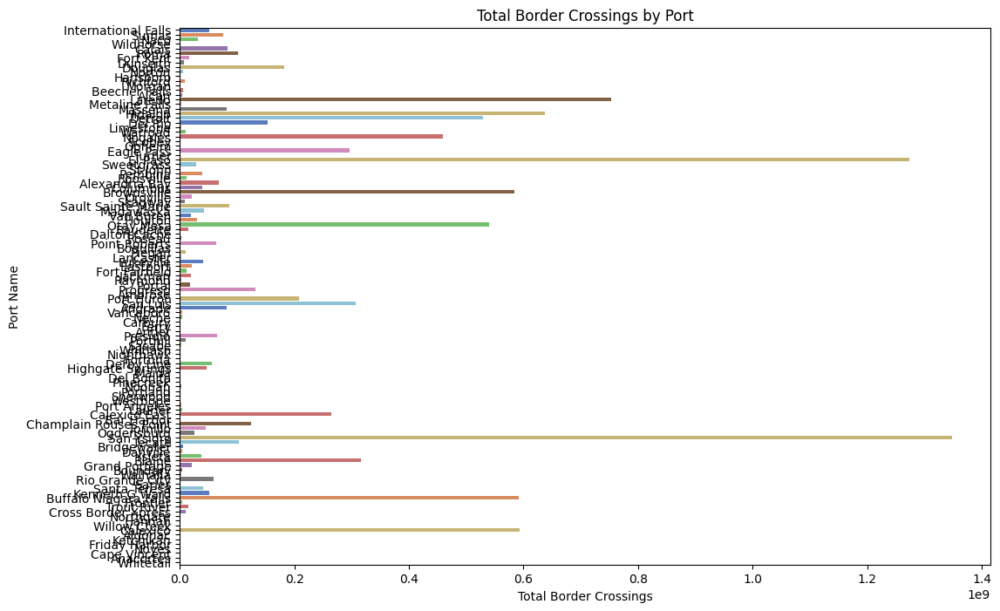

In [20]:
# Port-wise analysis
plt.figure(figsize=(12, 8))
sns.barplot(x='Value', y='Port Name', data=Border_Crossing_Data, estimator=sum, ci=None, palette='muted')
plt.title('Total Border Crossings by Port')
plt.xlabel('Total Border Crossings')
plt.ylabel('Port Name')
plt.show()


In [21]:
#on Which states have the highest Occurrence in each border
Border_Crossing_Data.groupby(['Border','State']).count()

Port Name  Port Code  Measure  Value  Latitude  \
Border           State                                                          
US-Canada Border Alaska            12606      12606    12606  12606     12606   
                 Idaho              7463       7463     7463   7463      7463   
                 Maine             42751      42751    42751  42751     42751   
                 Michigan          11843      11843    11843  11843     11843   
                 Minnesota         25791      25791    25791  25791     25791   
                 Montana           41850      41850    41850  41850     41850   
                 New York          23721      23721    23721  23721     23721   
                 North Dakota      62926      62926    62926  62926     62926   
                 Vermont           18568      18568    18568  18568     18568   
                 Washington        49793      49793    49793  49793     49793   
US-Mexico Border Arizona           21747      21747    21747  21747     21747   
                 California        21338      21338    21338  21338     21338   
                 New Mexico         7265       7265     7265   7265      7265   
                 Texas             41160      41160    41160  41160     41160   

                               Longitude  Point   Year  Month    Day  
Border           State                                                
US-Canada Border Alaska            12606  12606  12606  12606  12606  
                 Idaho              7463   7463   7463   7463   7463  
                 Maine             42751  42751  42751  42751  42751  
                 Michigan          11843  11843  11843  11843  11843  
                 Minnesota         25791  25791  25791  25791  25791  
                 Montana           41850  41850  41850  41850  41850  
                 New York          23721  23721  23721  23721  23721  
                 North Dakota      62926  62926  62926  62926  62926  
                 Vermont           18568  18568  18568  18568  18568  
                 Washington        49793  49793  49793  49793  49793  
US-Mexico Border Arizona           21747  21747  21747  21747  21747  
                 California        21338  21338  21338  21338  21338  
                 New Mexico         7265   7265   7265   7265   7265  
                 Texas             41160  41160  41160  41160  41160

<ipython-input-22-306c8fee7b92>:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0].set_xticklabels(border_us_canada_count.index, rotation=80)
<ipython-input-22-306c8fee7b92>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1].set_xticklabels(border_us_mexico_count.index, rotation=80)


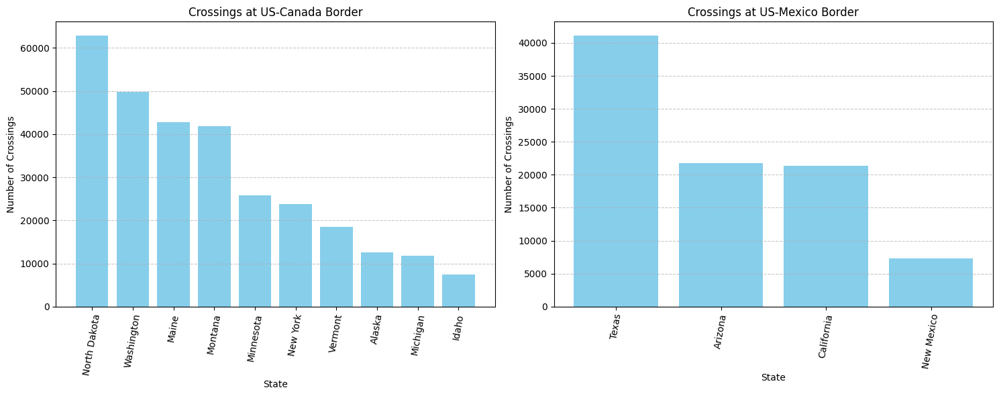

In [22]:
# Set up subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot for Border = "US-Canada Border"
df_us_canada = Border_Crossing_Data[Border_Crossing_Data['Border'] == 'US-Canada Border']
border_us_canada_count = df_us_canada['State'].value_counts()
axes[0].bar(border_us_canada_count.index, border_us_canada_count.values, color='skyblue')
axes[0].set_title('Crossings at US-Canada Border')
axes[0].set_xlabel('State')
axes[0].set_ylabel('Number of Crossings')
axes[0].set_xticklabels(border_us_canada_count.index, rotation=80)
axes[0].grid(axis='y', linestyle='--', alpha=0.7)

# Plot for Border = "US-Mexico Border"
df_us_mexico = Border_Crossing_Data[Border_Crossing_Data['Border'] == 'US-Mexico Border']
border_us_mexico_count = df_us_mexico['State'].value_counts()
axes[1].bar(border_us_mexico_count.index, border_us_mexico_count.values, color='skyblue')
axes[1].set_title('Crossings at US-Mexico Border')
axes[1].set_xlabel('State')
axes[1].set_ylabel('Number of Crossings')
axes[1].set_xticklabels(border_us_mexico_count.index, rotation=80)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


In [23]:
# Check the number of unique borders
num_borders = len(Border_Crossing_Data['Border'].unique())
print("Number of unique borders:", num_borders)

Number of unique borders: 2


In [26]:
Border_Crossing_Data.columns

Index(['Port Name', 'State', 'Port Code', 'Border', 'Measure', 'Value',
       'Latitude', 'Longitude', 'Point', 'Year', 'Month', 'Day'],
      dtype='object')

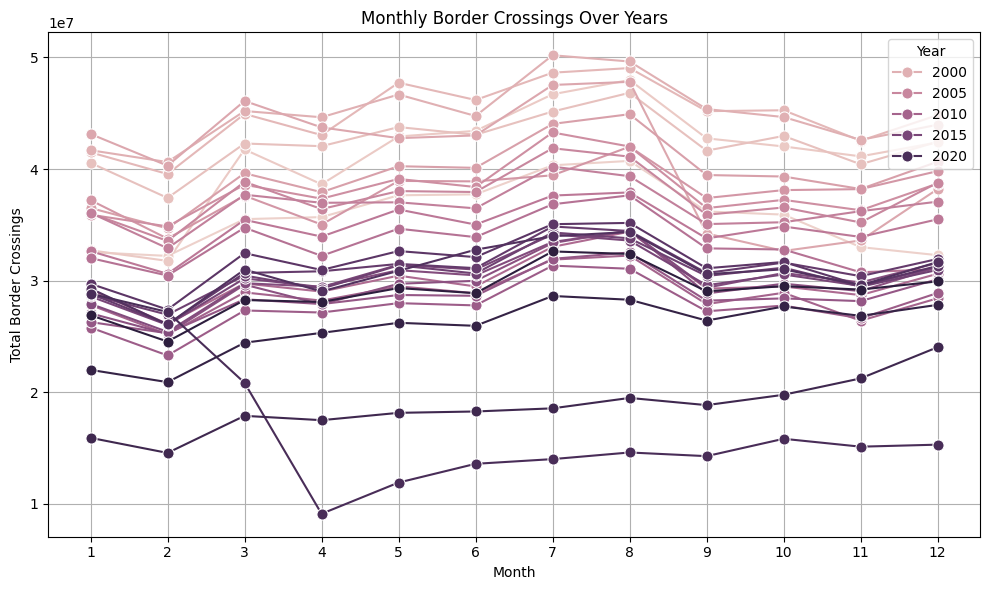

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming your dataset is stored in a DataFrame called df
# Aggregate the data by year, month, and value
monthly_data = Border_Crossing_Data.groupby(['Year', 'Month'])['Value'].sum().reset_index()

# Plot the graph
plt.figure(figsize=(10, 6))
sns.lineplot(data=monthly_data, x='Month', y='Value', hue='Year', marker='o', markersize=8)
plt.title('Monthly Border Crossings Over Years')
plt.xlabel('Month')
plt.ylabel('Total Border Crossings')
plt.legend(title='Year', loc='upper right')
plt.grid(True)
plt.xticks(range(1, 13))  # Set x-axis ticks to represent months
plt.tight_layout()
plt.show()


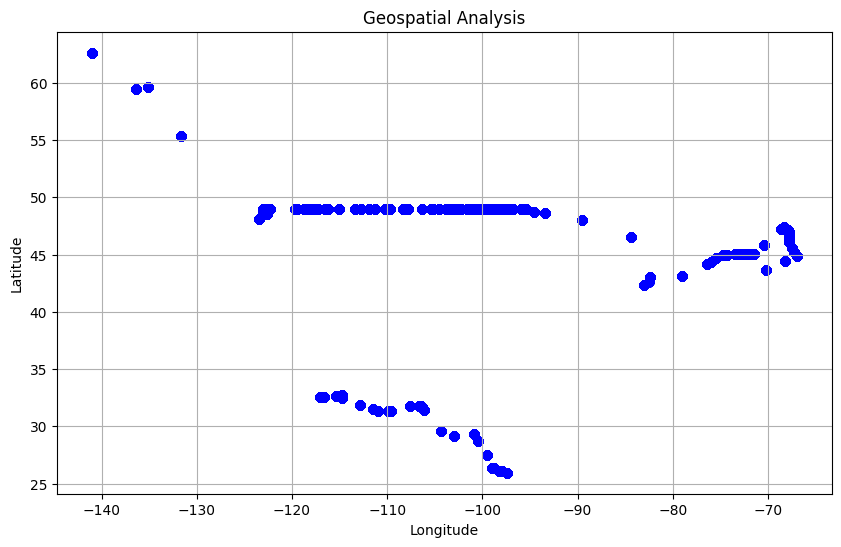

In [29]:
import matplotlib.pyplot as plt

latitude = Border_Crossing_Data['Latitude']
longitude = Border_Crossing_Data['Longitude']

# Plot the geospatial data
plt.figure(figsize=(10, 6))
plt.scatter(longitude, latitude, color='blue', alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geospatial Analysis')
plt.grid(True)
plt.show()


In [30]:
import plotly.express as px

# Create a scatter plot using Plotly Express
fig = px.scatter_mapbox(Border_Crossing_Data, lat="Latitude", lon="Longitude", hover_name="Port Name",
                        color_discrete_sequence=["blue"], zoom=3, height=600)
# Update layout to use Mapbox
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


In [31]:
!pip install wordcloud

In [33]:
from wordcloud import WordCloud, ImageColorGenerator

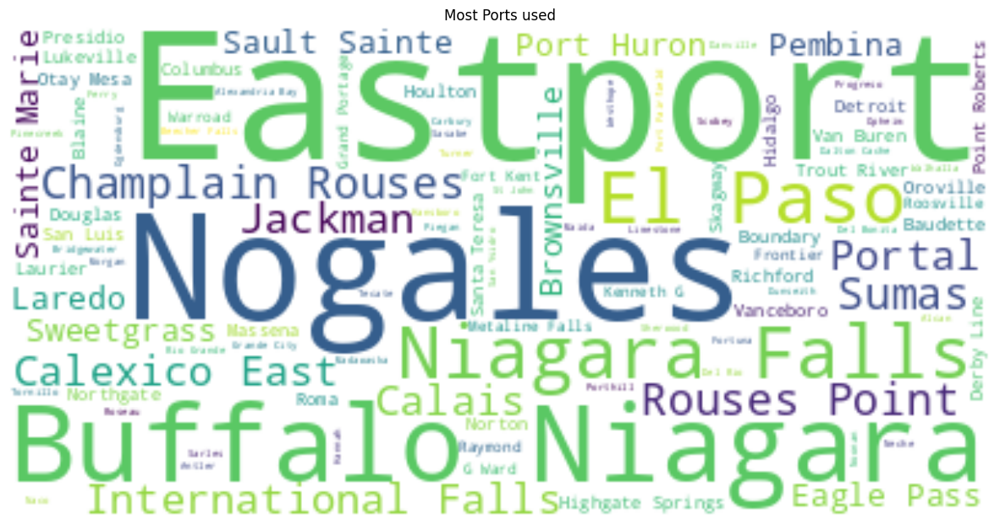

In [34]:
from wordcloud import WordCloud

# Concatenate all port names into a single string
text = " ".join(str(each) for each in Border_Crossing_Data['Port Name'])

# Create the WordCloud object
wordcloud = WordCloud(max_words=100, background_color="white").generate(text)

# Plot the word cloud
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title('Most Ports used')
plt.show()

In [35]:
Border_Crossing_Data.columns


Index(['Port Name', 'State', 'Port Code', 'Border', 'Measure', 'Value',
       'Latitude', 'Longitude', 'Point', 'Year', 'Month', 'Day'],
      dtype='object')

In [36]:
# Define features (X) and target variable (y)
X = Border_Crossing_Data[['Port Code', 'Border', 'Measure', 'Latitude', 'Longitude','Month', 'Day']]
y = Border_Crossing_Data['Value']


In [37]:
X = pd.get_dummies(X)

In [38]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)


In [39]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [40]:
# Print the shapes of the training and testing sets
print("Training set shape (X):", X_train.shape)
print("Training set shape (y):", y_train.shape)
print("Testing set shape (X):", X_test.shape)
print("Testing set shape (y):", y_test.shape)

Training set shape (X): (311057, 19)
Training set shape (y): (311057,)
Testing set shape (X): (77765, 19)
Testing set shape (y): (77765,)


**LinearRegression**

In [43]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Train the linear regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Make predictions on the testing set
lr_y_pred = lr_model.predict(X_test)

# Calculate Mean Squared Error
lr_mse = mean_squared_error(y_test, lr_y_pred)
print("Linear Regression Mean Squared Error:", lr_mse)


Linear Regression Mean Squared Error: 19314086201.353283


In [50]:
from sklearn.metrics import mean_squared_error, r2_score

# Calculate Mean Squared Error (MSE)
lr_mse = mean_squared_error(y_test, lr_y_pred)
print("Linear Regression Mean Squared Error:", lr_mse)

# Calculate Root Mean Squared Error (RMSE)
lr_rmse = np.sqrt(lr_mse)
print("Linear Regression Root Mean Squared Error:", lr_rmse)

# Calculate R-squared (R^2) score
lr_r2 = r2_score(y_test, lr_y_pred)
print("Linear Regression R-squared Score:", lr_r2)


Linear Regression Mean Squared Error: 19314086201.353283
Linear Regression Root Mean Squared Error: 138975.12799545567
Linear Regression R-squared Score: 0.16017528865050368


**DecisionTreeRegressor**

In [54]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [44]:
from sklearn.tree import DecisionTreeRegressor

# Train the decision tree regression model
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train, y_train)

# Make predictions on the testing set
dt_y_pred = dt_model.predict(X_test)

# Calculate Mean Squared Error
dt_mse = mean_squared_error(y_test, dt_y_pred)
print("Decision Tree Mean Squared Error:", dt_mse)


Decision Tree Mean Squared Error: 3059854858.648782


In [51]:
# Evaluate decision tree model
dt_mse = mean_squared_error(y_test, dt_y_pred)
dt_rmse = np.sqrt(dt_mse)
dt_r2 = r2_score(y_test, dt_y_pred)
print("Decision Tree Mean Squared Error:", dt_mse)
print("Decision Tree Root Mean Squared Error:", dt_rmse)
print("Decision Tree R-squared Score:", dt_r2)

Decision Tree Mean Squared Error: 3059854858.648782
Decision Tree Root Mean Squared Error: 55315.954829043505
Decision Tree R-squared Score: 0.8669498677469911


**RandomForestRegressor**

In [45]:
from sklearn.ensemble import RandomForestRegressor

# Train the random forest regression model
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Make predictions on the testing set
rf_y_pred = rf_model.predict(X_test)

# Calculate Mean Squared Error
rf_mse = mean_squared_error(y_test, rf_y_pred)
print("Random Forest Mean Squared Error:", rf_mse)


Random Forest Mean Squared Error: 3063705135.9224863


In [52]:
# Evaluate random forest model
rf_mse = mean_squared_error(y_test, rf_y_pred)
rf_rmse = np.sqrt(rf_mse)
rf_r2 = r2_score(y_test, rf_y_pred)
print("Random Forest Mean Squared Error:", rf_mse)
print("Random Forest Root Mean Squared Error:", rf_rmse)
print("Random Forest R-squared Score:", rf_r2)


Random Forest Mean Squared Error: 3063705135.9224863
Random Forest Root Mean Squared Error: 55350.74648026426
Random Forest R-squared Score: 0.8667824480737902


GradientBoostingRegressor

In [46]:
from sklearn.ensemble import GradientBoostingRegressor

# Train the gradient boosting regression model
gb_model = GradientBoostingRegressor()
gb_model.fit(X_train, y_train)

# Make predictions on the testing set
gb_y_pred = gb_model.predict(X_test)

# Calculate Mean Squared Error
gb_mse = mean_squared_error(y_test, gb_y_pred)
print("Gradient Boosting Mean Squared Error:", gb_mse)


Gradient Boosting Mean Squared Error: 6054962242.107162


In [53]:
# Evaluate gradient boosting model
gb_mse = mean_squared_error(y_test, gb_y_pred)
gb_rmse = np.sqrt(gb_mse)
gb_r2 = r2_score(y_test, gb_y_pred)
print("Gradient Boosting Mean Squared Error:", gb_mse)
print("Gradient Boosting Root Mean Squared Error:", gb_rmse)
print("Gradient Boosting R-squared Score:", gb_r2)

Gradient Boosting Mean Squared Error: 6054962242.107162
Gradient Boosting Root Mean Squared Error: 77813.6378927702
Gradient Boosting R-squared Score: 0.736715117443483


In [55]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

In [65]:
from statsmodels.tsa.arima.model import ARIMA

# Assuming 'Value' is the column you want to forecast
endog = Border_Crossing_Data['Value']

p = 1
d = 1
q = 1

# Fit ARIMA model on training data
arima_model = ARIMA(endog, order=(p, d, q))
arima_model_fit = arima_model.fit()

# Forecast future values
forecast = arima_model_fit.forecast(steps=len(X_test))

# Print the forecasted values
print(forecast)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



388822    31007.186618
388823    30929.573848
388824    30929.799429
388825    30929.798773
388826    30929.798775
              ...     
466582    30929.798775
466583    30929.798775
466584    30929.798775
466585    30929.798775
466586    30929.798775
Name: predicted_mean, Length: 77765, dtype: float64


In [68]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Assuming you have already predicted classes for ARIMA model (arima_y_pred_classes)
# Calculate precision
arima_precision = precision_score(y_test, arima_y_pred_classes, average='micro')

# Calculate recall
arima_recall = recall_score(y_test, arima_y_pred_classes, average='micro')

# Calculate F1-score
arima_f1 = f1_score(y_test, arima_y_pred_classes, average='micro')

# Calculate accuracy
arima_accuracy = accuracy_score(y_test, arima_y_pred_classes)

print("ARIMA Precision:", arima_precision)
print("ARIMA Recall:", arima_recall)
print("ARIMA F1-score:", arima_f1)
print("ARIMA Accuracy:", arima_accuracy)


ARIMA Precision: 0.010171671060245613
ARIMA Recall: 0.010171671060245613
ARIMA F1-score: 0.010171671060245613
ARIMA Accuracy: 0.010171671060245613


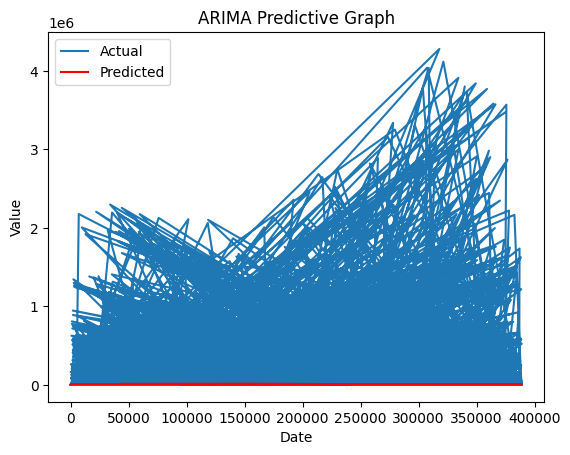

In [69]:
import matplotlib.pyplot as plt

# Plot the actual values
plt.plot(y_test.index, y_test, label='Actual')

# Plot the predicted values
plt.plot(y_test.index, arima_y_pred, label='Predicted', color='red')

# Add labels and title
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('h')
plt.legend()

# Show the plot
plt.show()


In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define SARIMA model parameters
p = 1  # Autoregressive order
d = 1  # Differencing order
q = 1  # Moving average order
P = 1  # Seasonal autoregressive order
D = 1  # Seasonal differencing order
Q = 1  # Seasonal moving average order
m = 12  # Seasonal period

# Define SARIMA model
sarima_model = SARIMAX(y_train, order=(p, d, q), seasonal_order=(P, D, Q, m))

# Fit SARIMA model
sarima_model_fit = sarima_model.fit()

# Make predictions
sarima_y_pred = sarima_model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1)

# Convert predictions to binary classes (if needed)
sarima_y_pred_classes = [1 if pred >= threshold else 0 for pred in sarima_y_pred]

# Evaluate SARIMA model
sarima_accuracy = accuracy_score(y_test, sarima_y_pred_classes)
sarima_precision = precision_score(y_test, sarima_y_pred_classes)
sarima_recall = recall_score(y_test, sarima_y_pred_classes)
sarima_f1 = f1_score(y_test, sarima_y_pred_classes)

print("SARIMA Accuracy:", sarima_accuracy)
print("SARIMA Precision:", sarima_precision)
print("SARIMA Recall:", sarima_recall)
print("SARIMA F1-score:", sarima_f1)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



In [ ]:
import matplotlib.pyplot as plt

# Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, sarima_y_pred, label='Predictions')
plt.title('SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


**SARIMAX**

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

train_size = int(len(ts_data) * 0.8)
train, test = ts_data.iloc[:train_size], ts_data.iloc[train_size:]

# Train the SARIMA model
model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_model = model.fit()

predictions = sarima_model.forecast(steps=len(test))

mse = mean_squared_error(test, predictions)
print("Mean Squared Error (SARIMA):", mse)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Mean Squared Error (SARIMA): 111941481436535.22


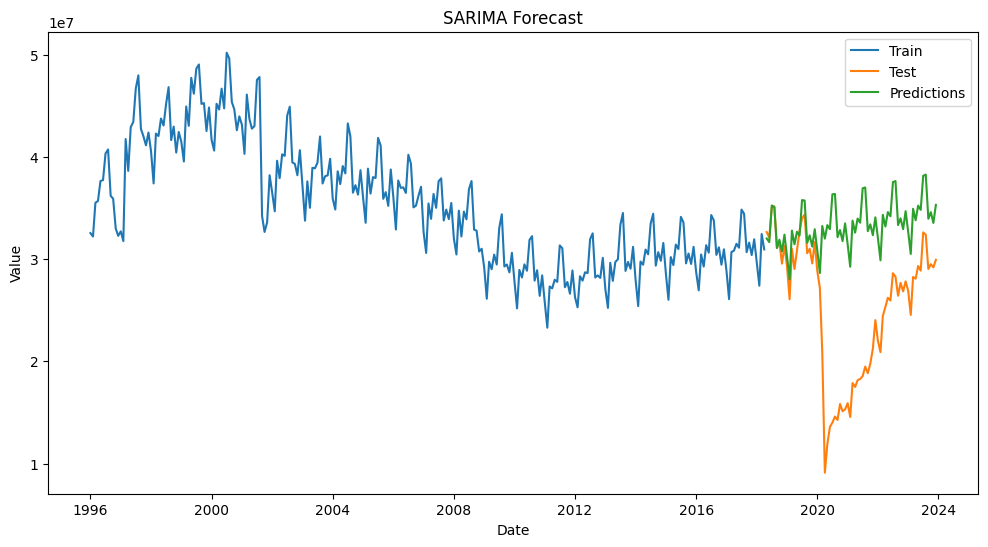

In [ ]:
# Plot predictions
plt.figure(figsize=(12,6))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Test')
plt.plot(test.index, predictions, label='Predictions')
plt.title('SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()